<a href="https://colab.research.google.com/github/quang08/YOLOv8_traffic_detection/blob/main/TrainYOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Sat Sep 16 02:47:14 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 617.0/617.0 kB 9.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo checks

Ultralytics YOLOv8.0.180 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data=/content/gdrive/MyDrive/YOLO/data/data.yaml epochs=20 imgsz=640

100% 49.7M/49.7M [00:00<00:00, 431MB/s]
Ultralytics YOLOv8.0.180 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/gdrive/MyDrive/YOLO/data/data.yaml, epochs=20, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=

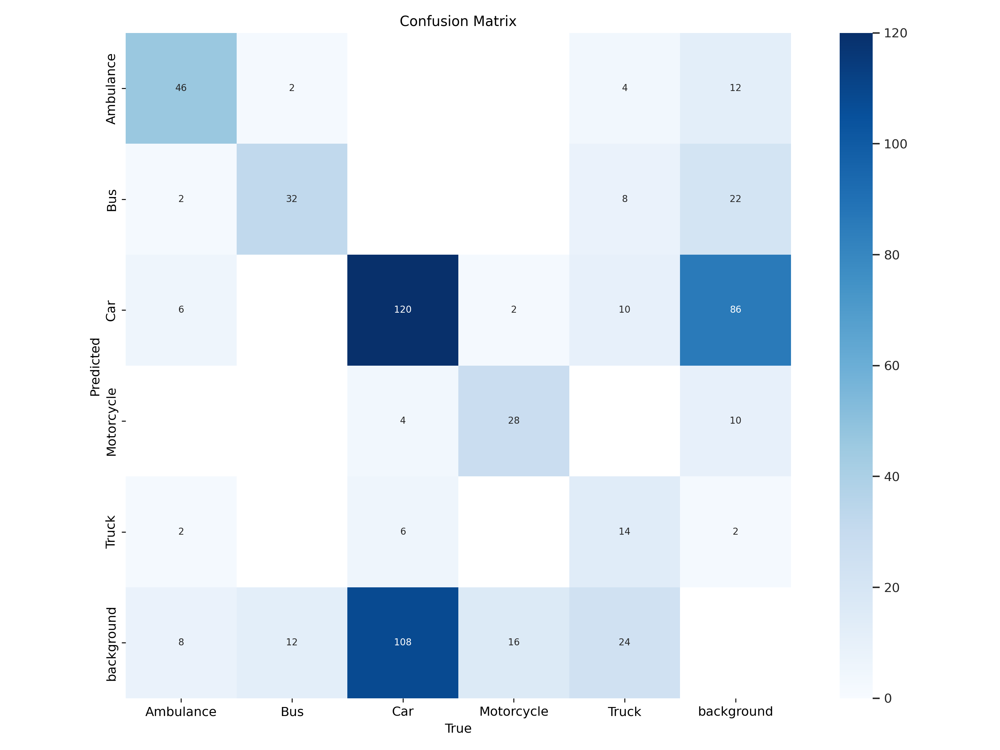

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

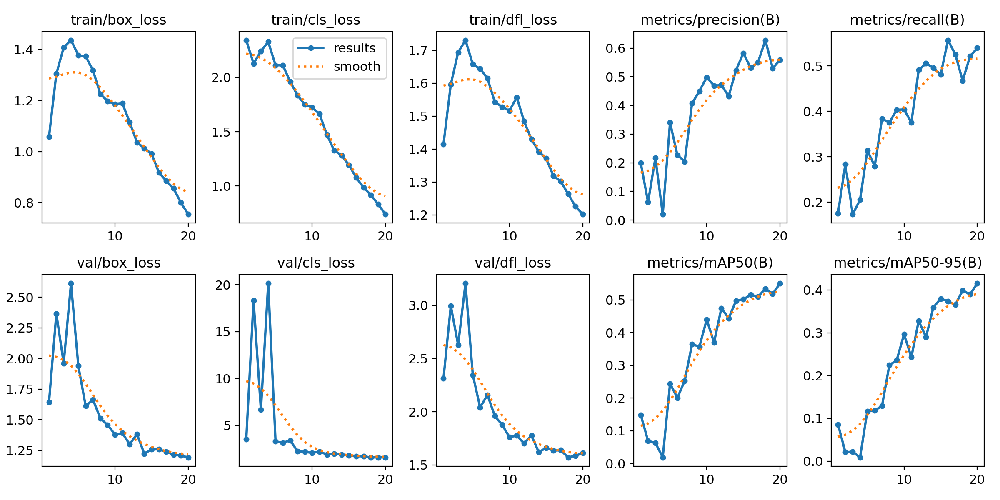

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/gdrive/MyDrive/YOLO/data/data.yaml

Ultralytics YOLOv8.0.180 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842655 parameters, 0 gradients
val: Scanning /content/gdrive/MyDrive/YOLO/data/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100% 250/250 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 16/16 [00:08<00:00,  1.79it/s]
                   all        250        454      0.579      0.518      0.551      0.416
             Ambulance        250         64       0.78      0.719      0.843      0.725
                   Bus        250         46      0.573      0.652      0.657      0.547
                   Car        250        238      0.589      0.487      0.475      0.314
            Motorcycle        250         46      0.599      0.584      0.493      0.291
                 Truck        250         60      0.354      0.146      0.286      0.201
Speed: 4.1ms preprocess, 21.7ms inference, 0.0

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.3 source=/content/gdrive/MyDrive/YOLO/data/test/images save_txt=true

Ultralytics YOLOv8.0.180 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842655 parameters, 0 gradients

image 1/126 /content/gdrive/MyDrive/YOLO/data/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 640x640 1 Ambulance, 37.0ms
image 2/126 /content/gdrive/MyDrive/YOLO/data/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg: 640x640 1 Ambulance, 37.1ms
image 3/126 /content/gdrive/MyDrive/YOLO/data/test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg: 640x640 2 Buss, 37.2ms
image 4/126 /content/gdrive/MyDrive/YOLO/data/test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg: 640x640 2 Buss, 37.0ms
image 5/126 /content/gdrive/MyDrive/YOLO/data/test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg: 640x640 2 Buss, 37.1ms
image 6/126 /content/gdrive/MyDrive/YOLO/data/test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg: 640x640 2 Buss, 37.0ms
image 7/126

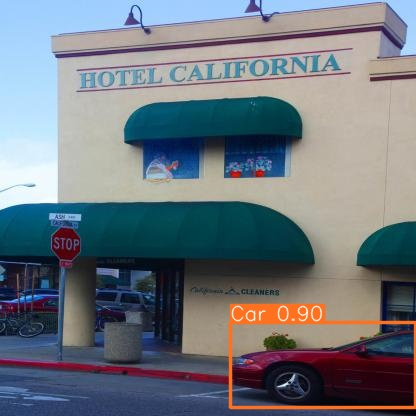

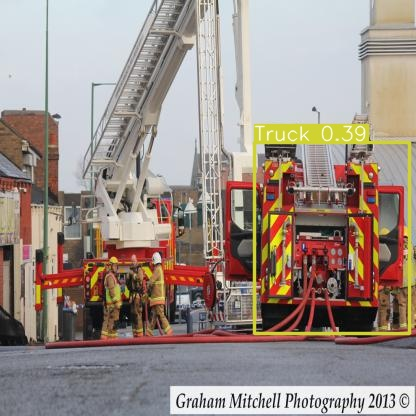

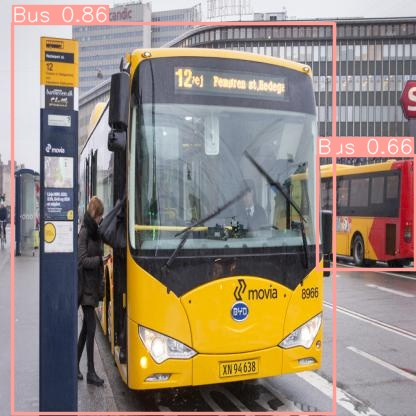

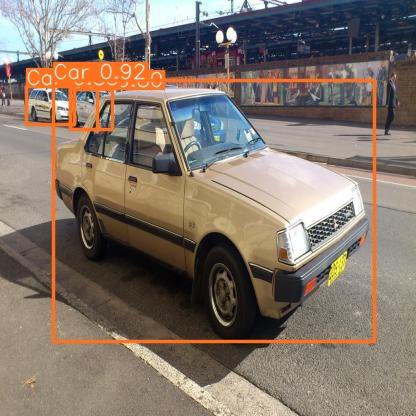

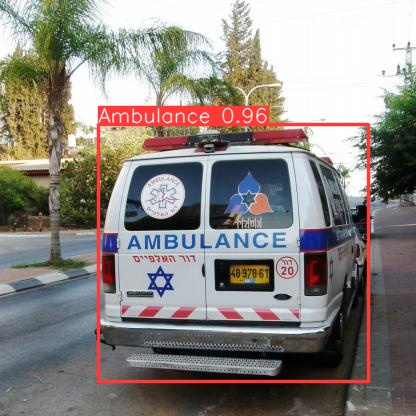

...

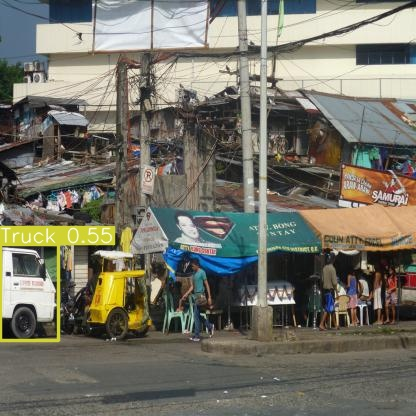

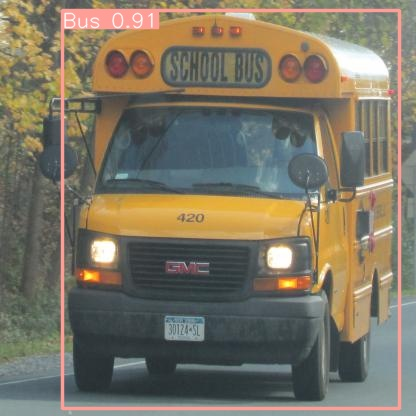

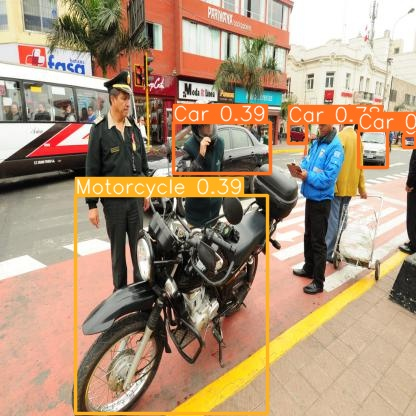

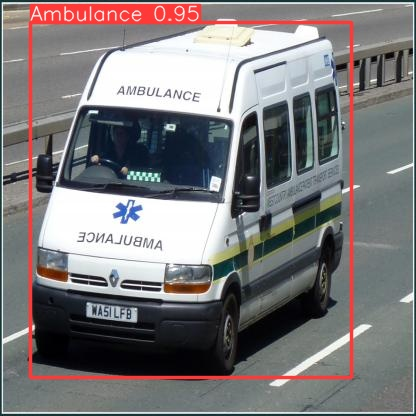

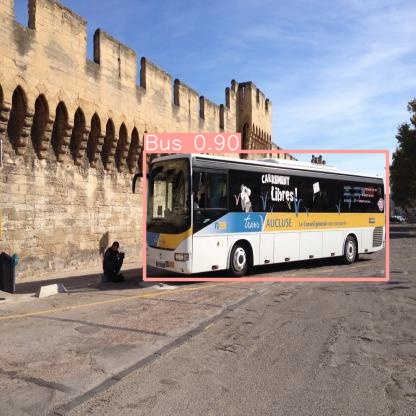

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path, height=600))
  print('\n')

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.3 source=/content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4 save_txt=true

Ultralytics YOLOv8.0.180 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842655 parameters, 0 gradients

video 1/1 (1/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 11 Cars, 66.5ms
video 1/1 (2/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 11 Cars, 25.9ms
video 1/1 (3/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 11 Cars, 25.9ms
video 1/1 (4/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 12 Cars, 25.8ms
video 1/1 (5/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 10 Cars, 25.9ms
video 1/1 (6/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 10 Cars, 25.8ms
video 1/1 (7/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 10 Cars, 25.8ms
video 1/1 (8/1800) /content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4: 384x640 11 Cars, 25.9ms
video 1/1 (9/1800) /content/gdrive/MyDrive/

In [ ]:
import cv2
import os

# Define the directory containing the video frames and labels
frames_dir = 'runs/detect/predict2'
video_path = '/content/gdrive/MyDrive/YOLO/data/test/videos/test4.mp4'  # Replace with the path to your video file

# Open the video file for reading
cap = cv2.VideoCapture(video_path)

# Get the video's frame width and height
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

# Define the codec and create a VideoWriter object for saving the annotated video
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
output_video_path = 'output_annotated_video.mp4'
out = cv2.VideoWriter(output_video_path, fourcc, 20.0, (frame_width, frame_height))

# Iterate through the video frames
for frame_filename in sorted(os.listdir(frames_dir)):
    if frame_filename.endswith('.jpg'):
        frame_path = os.path.join(frames_dir, frame_filename)
        frame = cv2.imread(frame_path)

        # Load the corresponding detection results (labels) for this frame
        label_path = os.path.join(frames_dir, 'labels', os.path.splitext(frame_filename)[0] + '.txt')
        with open(label_path, 'r') as label_file:
            for line in label_file:
                parts = line.strip().split()
                class_id = int(parts[0])
                x, y, w, h = map(float, parts[1:])
                x1, y1, x2, y2 = int((x - w / 2) * frame_width), int((y - h / 2) * frame_height), \
                                 int((x + w / 2) * frame_width), int((y + h / 2) * frame_height)

                # Draw bounding box and class label on the frame
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(frame, f'Class {class_id}', (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Write the annotated frame to the output video
        out.write(frame)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()
